In [1]:
%load_ext autoreload
%autoreload 2

## Basic setup

In [2]:
import concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')

data_dir = Path('../data/CBCEcombineN2/adata_celsub_Jun26-1610.h5ad')

In [3]:
import time
from pathlib import Path
proj_name = "concord_celN2"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
file_suffix = f"{time.strftime('%b%d-%H%M')}"
seed = 0

In [7]:
adata = sc.read_10x_h5(data_dir / "filtered_feature_bc_matrix.h5")
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [4]:
adata = sc.read_h5ad(data_dir / "concord_celN2_Jun12-1457.h5ad")

## Run Concord

In [5]:
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3') # Loosely select features based on Seurat v3 method (so that enough information is preserved)

concord_args = {
        'adata': adata,
        'input_feature': feature_list,
        'batch_size':64, # Batch size for training, adjust as needed
        'latent_dim': 300, # Latent dimension size, adjust as needed
        'encoder_dims':[1000], # Encoder dimensions, recommended to be larger than latent_dim
        'use_decoder': False, # Whether to use a decoder, set to True if you want to use the decoder
        'decoder_dims':[1000], # Decoder dimensions, ignored if use_decoder is False
        'augmentation_mask_prob': 0.3, # Probability of masking features, recommended to be between 0.2 and 0.5
        'clr_temperature': 0.3, # Temperature for contrastive loss, recommended to be between 0.1 and 0.5
        'p_intra_knn': 0.3, # Probability of intra-neighborhood sampling, must be less than 0.5
        'sampler_knn': 300, # Size of neighbohood for intra-neighborhood sampling
        'p_intra_domain': .95, # Enrichment probability for intra-domain sampling, recommended to be between 0.85 and 1.0, note the lower the value, the more dataset-specific information (may contain batch effects) is preserved
        'n_epochs': 15, # Number of epochs for training, adjust as needed
        'verbose': True, # Verbosity level, set to True for more detailed output
        'seed': seed, # random seed for reproducibility
        'device': device, # Device for training, can be 'cpu', 'cuda', or 'mps'
        'save_dir': save_dir # Directory to save the model and results
    }

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [7]:
output_key = 'Concord'
cur_ccd = ccd.Concord(**concord_args)
cur_ccd.fit_transform(output_key=output_key) # Result saved to ccd.adata.obsm[output_key]
adata.obsm = cur_ccd.adata.obsm.copy() # Copy the results to adata.obsm

Concord - INFO - Operating directly on the provided AnnData object. Object may be modified.
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
Concord - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
Concord - INFO - Encoder input dim: 10000
Concord - INFO - Model loaded to device: cpu
Concord - INFO - Total number of parameters: 10303908
Concord - INFO - Starting 2 warm-up epochs with k-NN sampling disabled.
Concord - INFO - Loading all data into memory.
Concord - INFO - Starting epoch 1/15
Concord - INFO - Processing chunk 1/1 for epoch 1
Concord - INFO - Number of samples in train_dataloader: 12899


Epoch 0 Training: 100%|██████████| 201/201 [00:03<00:00, 55.60it/s, loss=2.31]

Concord - INFO - Epoch   0 | Train Loss: 2.54, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.54, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 2/15
Concord - INFO - Processing chunk 1/1 for epoch 2
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 1 Training: 100%|██████████| 201/201 [00:03<00:00, 58.57it/s, loss=2.13]

Concord - INFO - Epoch   1 | Train Loss: 2.14, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.14, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 3/15
Concord - INFO - Warm-up complete. Computing k-NN graph on learned embeddings.
Concord - INFO - Loading all data into memory.


Concord - INFO - Predicting for chunk 1/1
Concord - INFO - Loading all data into memory.


FAISS not found. Using sklearn for k-NN computation.


Concord - INFO - Processing chunk 1/1 for epoch 3
Concord - INFO - Number of samples in train_dataloader: 12899


Epoch 2 Training: 100%|██████████| 201/201 [00:03<00:00, 54.82it/s, loss=2.39]

Concord - INFO - Epoch   2 | Train Loss: 2.39, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.39, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 4/15
Concord - INFO - Processing chunk 1/1 for epoch 4
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 3 Training: 100%|██████████| 201/201 [00:03<00:00, 56.62it/s, loss=2.38]

Concord - INFO - Epoch   3 | Train Loss: 2.29, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.29, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 5/15
Concord - INFO - Processing chunk 1/1 for epoch 5
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 4 Training: 100%|██████████| 201/201 [00:03<00:00, 57.58it/s, loss=2.28]

Concord - INFO - Epoch   4 | Train Loss: 2.23, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.23, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 6/15


Concord - INFO - Processing chunk 1/1 for epoch 6
Concord - INFO - Number of samples in train_dataloader: 12899


Epoch 5 Training: 100%|██████████| 201/201 [00:03<00:00, 54.99it/s, loss=2.22]

Concord - INFO - Epoch   5 | Train Loss: 2.19, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.19, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 7/15
Concord - INFO - Processing chunk 1/1 for epoch 7
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 6 Training: 100%|██████████| 201/201 [00:03<00:00, 57.05it/s, loss=2.11]

Concord - INFO - Epoch   6 | Train Loss: 2.15, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.15, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 8/15
Concord - INFO - Processing chunk 1/1 for epoch 8
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 7 Training: 100%|██████████| 201/201 [00:03<00:00, 55.93it/s, loss=2.08]

Concord - INFO - Epoch   7 | Train Loss: 2.12, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.12, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 9/15
Concord - INFO - Processing chunk 1/1 for epoch 9
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 8 Training: 100%|██████████| 201/201 [00:03<00:00, 56.32it/s, loss=2.09]

Concord - INFO - Epoch   8 | Train Loss: 2.10, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.10, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 10/15
Concord - INFO - Processing chunk 1/1 for epoch 10
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 9 Training: 100%|██████████| 201/201 [00:03<00:00, 55.79it/s, loss=2.07]

Concord - INFO - Epoch   9 | Train Loss: 2.08, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.08, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 11/15
Concord - INFO - Processing chunk 1/1 for epoch 11
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 10 Training: 100%|██████████| 201/201 [00:03<00:00, 55.07it/s, loss=2.03]

Concord - INFO - Epoch  10 | Train Loss: 2.06, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.06, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 12/15
Concord - INFO - Processing chunk 1/1 for epoch 12
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 11 Training: 100%|██████████| 201/201 [00:03<00:00, 56.43it/s, loss=2.06]

Concord - INFO - Epoch  11 | Train Loss: 2.04, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.04, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 13/15
Concord - INFO - Processing chunk 1/1 for epoch 13
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 12 Training: 100%|██████████| 201/201 [00:03<00:00, 56.85it/s, loss=2.01]

Concord - INFO - Epoch  12 | Train Loss: 2.03, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.03, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 14/15
Concord - INFO - Processing chunk 1/1 for epoch 14
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 13 Training: 100%|██████████| 201/201 [00:03<00:00, 56.55it/s, loss=2]   

Concord - INFO - Epoch  13 | Train Loss: 2.01, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.01, IMPORTANCE: 0.00
Concord - INFO - Starting epoch 15/15
Concord - INFO - Processing chunk 1/1 for epoch 15
Concord - INFO - Number of samples in train_dataloader: 12899



Epoch 14 Training: 100%|██████████| 201/201 [00:03<00:00, 55.34it/s, loss=2]   

Concord - INFO - Epoch  14 | Train Loss: 2.00, MSE: 0.00, CLASS: 0.00, CONTRAST: 2.00, IMPORTANCE: 0.00


Concord - INFO - Model saved to ../save/dev_concord_celN2-Jun23/final_model_Jun23-1828.pt
Concord - INFO - Final model saved at: ../save/dev_concord_celN2-Jun23/final_model_Jun23-1828.pt; Configuration saved at: ../save/dev_concord_celN2-Jun23/config_Jun23-1828.json.
Concord - INFO - Loading all data into memory.
Concord - INFO - Predicting for chunk 1/1
Concord - INFO - Predictions added to AnnData object with base key 'Concord'.


In [ ]:
from compute_cel_time import compute_time
import pandas as pd
bulk = pd.read_csv("../resources/ce_time_compute/whole.embryo.interval.timecourse.tsv", sep="\t", index_col=0)

# replace the first and second column names with the new names "mpfc_000""mpfc_005"
# You cannot assign to bulk.columns[0:2] directly because pandas Index does not support item assignment.
# Instead, create a new list of column names and assign it back to bulk.columns.
cols = list(bulk.columns)
cols[0] = "mpfc_000"
cols[1] = "mpfc_005"
bulk.columns = cols
ref_time = bulk.columns.str.replace("mpfc_", "").astype(int)
adata = compute_time(
    adata,
    bulk,
    ref_time,
    name="BestTime_Yanai",
    pseudoCountSingle=1,
    pseudoCountBulk=1,
    minAutoCor=0.6,
    minSD=1.5,
    detect_low=1,
    detect_high=7,
    span=0.5,
)
adata.obs['raw.embryo.time'] = adata.obs['BestTime_Yanai'].copy()

Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP']


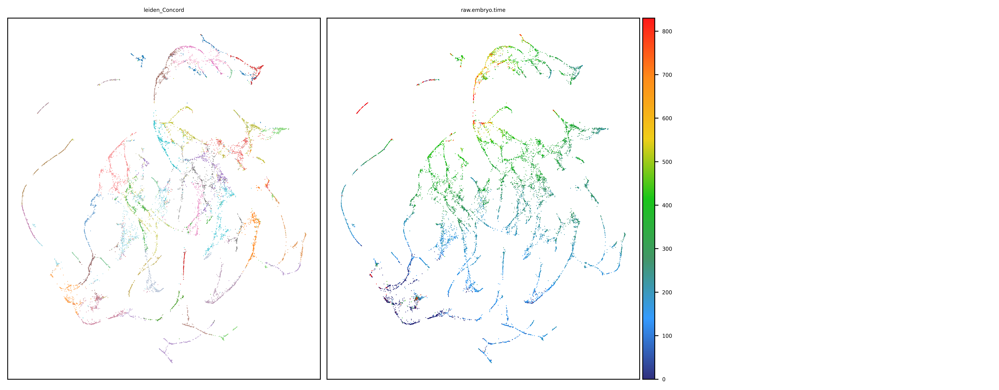

In [8]:
basis = output_key
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = basis + '_UMAP'
#show_cols = ['cell.type', 'raw.embryo.time', "lineage"]
show_cols = [f'leiden_{output_key}', 'raw.embryo.time']
pal = {f'leiden_{output_key}':'tab20', 'raw.embryo.time': 'BlueGreenRed'}
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,5), dpi=600, ncols=3, font_size=5, point_size=2, legend_loc=None,
    pal = pal,
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [58]:
ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
import plotly.io as pio
pio.renderers.default = 'notebook'
for col in show_cols:
    show_basis = f'{basis}_UMAP_3D'
    ccd.pl.plot_embedding_3d(
            adata, basis=show_basis, color_by=col,
            pal = pal[col],
            save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
            point_size=1, opacity=0.8, width=1500, height=1000
        )

Concord - INFO - UMAP embedding stored in adata.obsm['Concord_UMAP_3D']


In [ ]:
adata.write_h5ad(data_dir / f"{proj_name}_{file_suffix}.h5ad") # Save the adata object with the encoded embeddings
print(f"Saved adata to {data_dir / f'{proj_name}_{file_suffix}.h5ad'}")
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

Saved adata to ../data/celegans_binyamin/N2_outs/concord_celN2_Jun12-1457.h5ad
Concord - INFO - Normalized expression data (adata.layers['X_log1p']) not found. Renormalize and log transforming.
VisCello project created at ../data/celegans_binyamin/N2_outs/cello_concord_celN2_Jun12-1457
Saved viscello to ../data/celegans_binyamin/N2_outs/cello_concord_celN2_Jun12-1457.h5ad


### Prepare processed data for GEO

In [5]:
adata = sc.read_h5ad('../data/celegans_binyamin/N2_outs/concord_celN2_Jun12-1457.h5ad')

In [6]:
adata.layers

Layers with keys: counts

In [10]:
#!/usr/bin/env python
"""
Export an AnnData object to GEO-ready files:
  • matrix.mtx.gz  – sparse counts (Matrix Market)
  • genes.tsv.gz   – gene metadata  (from adata.var)
  • cells.tsv.gz   – cell metadata  (from adata.obs)
"""

import os
import gzip
import pandas as pd
from scipy import sparse
from scipy.io import mmwrite
import anndata as ad

# ─── 1. user settings ──────────────────────────────────────────────────────────
INPUT_ANNDATA = "../data/celegans_binyamin/N2_outs/concord_celN2_Jun12-1457.h5ad"          # ← your input file
OUTPUT_DIR    = "../data/celegans_binyamin/geo_export"            # ← destination folder
LAYER         = "counts"                 # ← which layer to export
COMPRESSION   = "gzip"                  # (leave as is)

# ─── 2. load AnnData ───────────────────────────────────────────────────────────
adata: ad.AnnData = ad.read_h5ad(INPUT_ANNDATA)

if LAYER in adata.layers:
    X = adata.layers[LAYER]
else:
    # fallback: use .X if requested layer missing
    print(f"⚠️  Layer '{LAYER}' not found; falling back to adata.X")
    X = adata.X

if not sparse.issparse(X):
    X = sparse.csr_matrix(X)

# ─── 3. make output folder ─────────────────────────────────────────────────────
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ─── 4. write matrix.mtx.gz ────────────────────────────────────────────────────
mtx_path = os.path.join(OUTPUT_DIR, "matrix.mtx")
mmwrite(mtx_path, X, field="integer")   # count data are integers
with open(mtx_path, "rb") as f_in, gzip.open(mtx_path + ".gz", "wb") as f_out:
    f_out.writelines(f_in)
os.remove(mtx_path)                     # keep only the compressed copy

# ─── 5. write genes.tsv.gz (adata.var) ─────────────────────────────────────────
genes_path = os.path.join(OUTPUT_DIR, "genes.tsv.gz")
adata.var.to_csv(
    genes_path,
    sep="\t",
    index=True,             # row index becomes first column in TSV
    header=True,
    compression=COMPRESSION
)

# ─── 6. write cells.tsv.gz (adata.obs) ─────────────────────────────────────────
cells_path = os.path.join(OUTPUT_DIR, "cells.tsv.gz")
adata.obs.to_csv(
    cells_path,
    sep="\t",
    index=True,
    header=True,
    compression=COMPRESSION
)

print(
    f"✅ Export complete:\n"
    f"  • {os.path.relpath(mtx_path + '.gz')}\n"
    f"  • {os.path.relpath(genes_path)}\n"
    f"  • {os.path.relpath(cells_path)}"
)

# ─── 7. (optional) summary ─────────────────────────────────────────────────────
print("\nMatrix shape:", X.shape)
print("Gene meta columns:", list(adata.var.columns))
print("Cell meta columns:", list(adata.obs.columns))


✅ Export complete:
  • ../data/celegans_binyamin/geo_export/matrix.mtx.gz
  • ../data/celegans_binyamin/geo_export/genes.tsv.gz
  • ../data/celegans_binyamin/geo_export/cells.tsv.gz

Matrix shape: (12899, 46926)
Gene meta columns: ['gene_ids', 'feature_types', 'genome']
Cell meta columns: ['leiden_Concord_Jun12-1457', 'BestTime_Yanai', 'BestTime_Yanai_SD', 'BestTime_Yanai_DR', 'raw.embryo.time', 'leiden_Concord']


In [11]:
adata.var

,gene_ids,feature_types,genome
aat-2,WBGene00000003,Gene Expression,Caenorhabditis_elegans_WBcel235
aat-6,WBGene00000007,Gene Expression,Caenorhabditis_elegans_WBcel235
abf-3,WBGene00000014,Gene Expression,Caenorhabditis_elegans_WBcel235
abf-4,WBGene00000015,Gene Expression,Caenorhabditis_elegans_WBcel235
abt-4,WBGene00000022,Gene Expression,Caenorhabditis_elegans_WBcel235
...,...,...,...
WBGene00014469,WBGene00014469,Gene Expression,Caenorhabditis_elegans_WBcel235
WBGene00014470,WBGene00014470,Gene Expression,Caenorhabditis_elegans_WBcel235
WBGene00014471,WBGene00014471,Gene Expression,Caenorhabditis_elegans_WBcel235
WBGene00014472,WBGene00014472,Gene Expression,Caenorhabditis_elegans_WBcel235


In [8]:
adata.obs

,leiden_Concord_Jun12-1457,BestTime_Yanai,BestTime_Yanai_SD,BestTime_Yanai_DR,raw.embryo.time,leiden_Concord
AAACCAAAGCCCTGCT-1,11,340,0.021484,0.069191,340,5
AAACCAAAGCTATCCT-1,26,190,0.029155,0.103676,190,24
AAACCAAAGCTGGAGA-1,18,0,0.029915,0.091116,0,30
AAACCAAAGCTTAGTG-1,0,150,0.017790,0.073411,150,6
AAACCAAAGGGTAGAT-1,7,550,0.054577,0.172550,550,20
...,...,...,...,...,...,...
TGTGTACGTGGCTCAC-1,12,350,0.039448,0.145506,350,16
TGTGTACGTTCCCTGT-1,17,220,0.033194,0.136990,220,27
TGTGTTAGTAGTTGAG-1,17,210,0.029517,0.109813,210,27
TGTGTTAGTTTCCTCA-1,5,190,0.029738,0.091703,190,2
